# HOUSING: PRICE PREDICTION

## Importing the Libraries

In [297]:
#Import libreries 

import pandas as pd #Data processing
import numpy as np #Linear algebra
from sklearn.preprocessing import StandardScaler #resize the distribution of values
from sklearn.linear_model import LinearRegression #algorithm
from sklearn.model_selection import train_test_split #estimate the performance
import statsmodels.api as sm 
import matplotlib.pyplot as plt #data visualization
import seaborn as sn  #data visualization

import warnings
warnings.filterwarnings("ignore")

Importing all neccessory Libreries

# Train dataset

## Importing train dataset

In [298]:
#Import the dataset

train_data= pd.read_csv(r"C:\Users\Chaitali Nakade\OneDrive\Desktop\dataset\housing project\train.csv")
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


Importing the train dataset and see all columns with first five rows.

In [299]:
pd.set_option('display.max_rows', None)

## Shape of data with number of rows and columns

In [300]:
train_data.shape

(1168, 81)

There are 1168 Rows and 81 Columns in training dataset

## Basic information of dataset

In [301]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

-	With this instruction we will get the basic information like is there any null value present in whole dataset, datatypes of all column and non-null values of column and column names. As shown in output there is null values present some columns in dataset.
-	Simultaneously we can find here only three columns are having floating data types, 35 columns are having integer datatype and other 43 columns are having object data type.

## Detailed description

In [302]:
train_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


We can see the detailed description of all the rows and columns like count, mean value, standard deviation, minimum and maximum value training dataset.

# Datatypes of all columns

In [303]:
train_data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


- we can find here only three columns are having floating data types
- 35 columns are having integer datatype 
- other 43 columns are having object data type.

# Checking is there any null value

In [304]:
#check is there any null value present in any column

train_data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

- There are so many column are having missing values in dataset.
- LotFrontage       214
- Alley            1091
- MasVnrType          7
- MasVnrArea          7
- BsmtQual           30
- BsmtCond           30
- BsmtExposure       31
- BsmtFinType1       30
- BsmtFinType2       31
- FireplaceQu       551
- GarageType         64
- GarageYrBlt        64
- GarageFinish       64
- GarageQual         64
- GarageCond         64
- PoolQC           1161
- Fence             931
- MiscFeature      1124

### visualization of missing values by heatmap

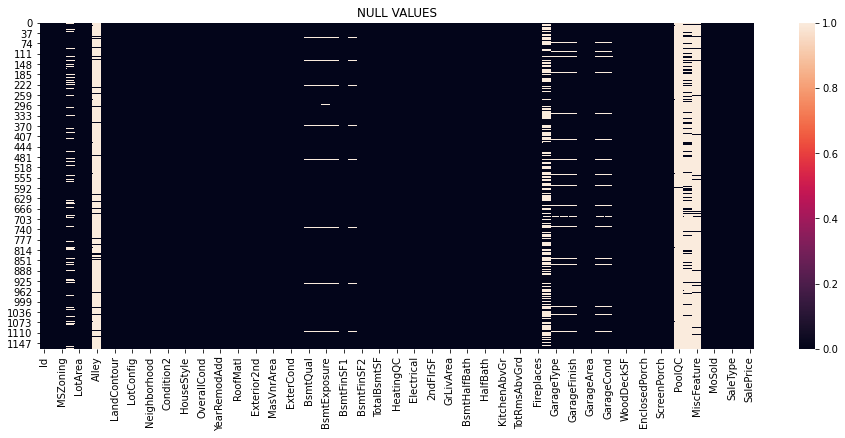

In [305]:
plt.figure(figsize=[16,6])
sn.heatmap(train_data.isnull())
plt.title("NULL VALUES")
plt.show()

we can see there are missing values present in so many columns of train dataset which represnts through white lines in above.

## EDA (Exploratory Data Analysis)

### Visualization (Uni Variate analysis)
Uni variate analysis works with only one variable, hence it is called uni variate.

In [306]:
fe = train_data[['MSZoning', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd','MasVnrType', 'Foundation', 'BsmtQual', 'BsmtCond']]

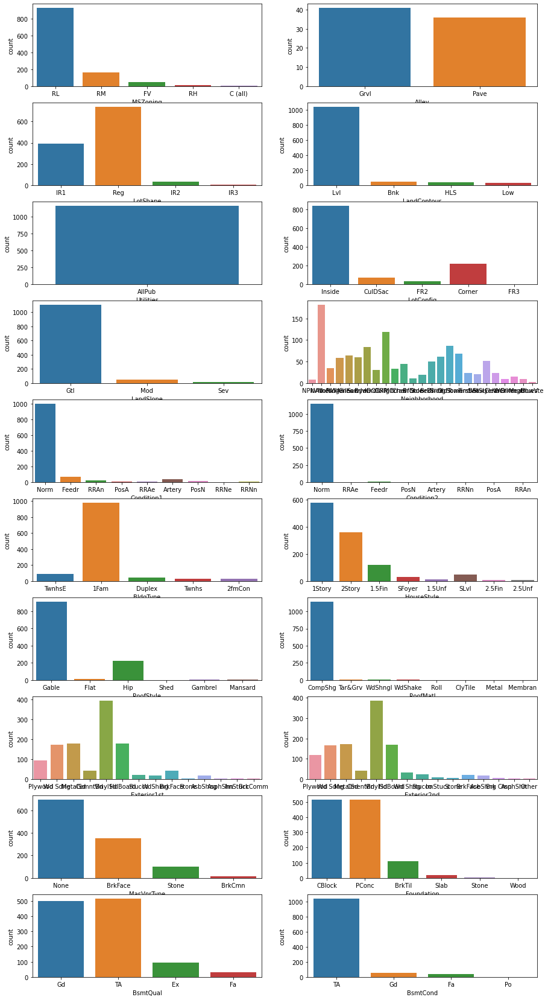

In [307]:
plt.figure(figsize = (15,90), facecolor = 'white')
plotnumber = 1

for column in fe:
    if plotnumber <= 25: # as we see there are 81 columns in the data
        ax = plt.subplot(30,2,plotnumber)
        sn.countplot(fe[column])
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

- The majority of the housing componies are mostly preferred to the Residential Low Density (RL), with the peak of 800 and above
- Extreme companies are having Type of alley access to property in between Gravel and Paved with the peak of Gravel
- In shape of property mostly housing companies preferred a regular size of property
and many more things can see.

In [308]:
fe2 = train_data[['BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']]

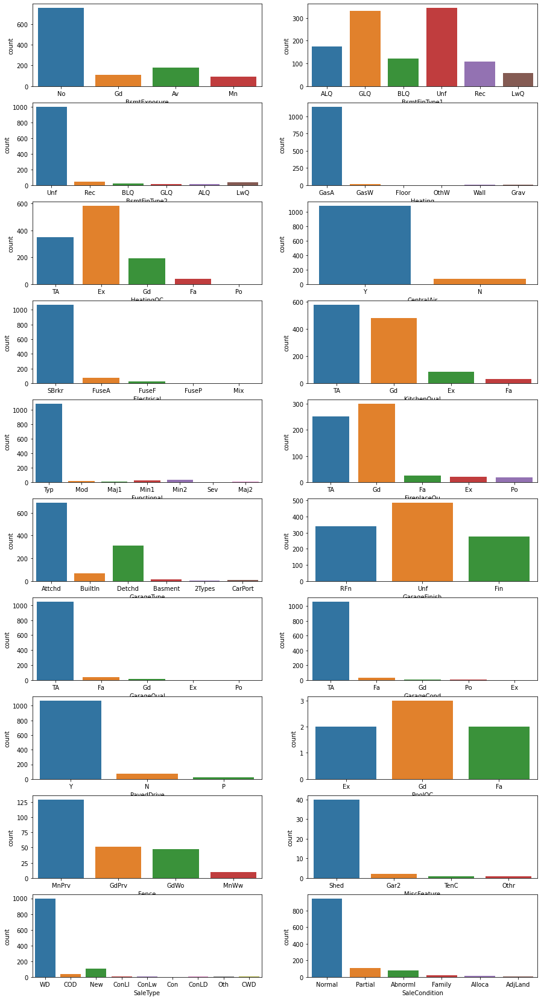

In [309]:
plt.figure(figsize = (15,90), facecolor = 'white')
plotnumber = 1

for column in fe2:
    if plotnumber <= 25: # as we see there are 81 columns in the data
        ax = plt.subplot(30,2,plotnumber)
        sn.countplot(fe2[column])
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

In [310]:
fe3 = train_data[['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']]

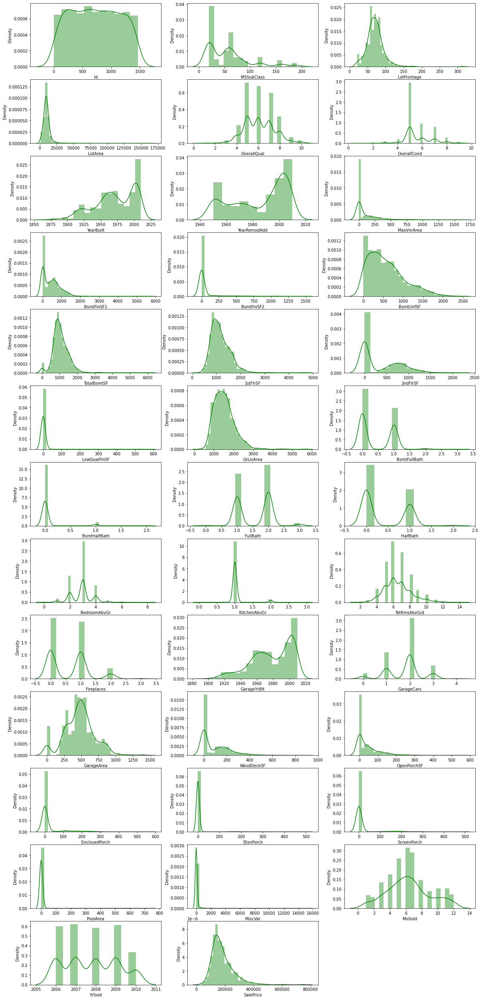

In [311]:
#Relationship Visualizing

plt.figure(figsize = (20,70), facecolor = 'white')
plotnumber = 1

for column in fe3:
    if plotnumber <= 45: # as we see there are 81 columns in the data
        ax = plt.subplot(20,3,plotnumber)
        sn.distplot(fe3[column], color = 'g')
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

As we can see there are maximum columns is having Skewness in it but some columns are catogorical in nature so in that no need to check skewness.

#### Histplot

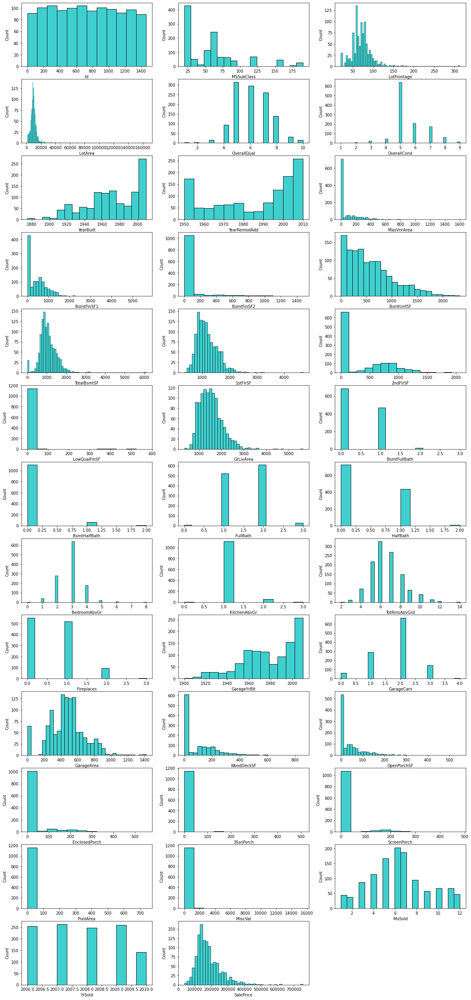

In [312]:
#Relationship Visualizing

plt.figure(figsize = (20,70), facecolor = 'white')
plotnumber = 1

for column in fe3:
    if plotnumber <= 45: # as we see there are 81 columns in the data
        ax = plt.subplot(20,3,plotnumber)
        sn.histplot(fe3[column], color = 'c')
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

### Analysis through boxplot

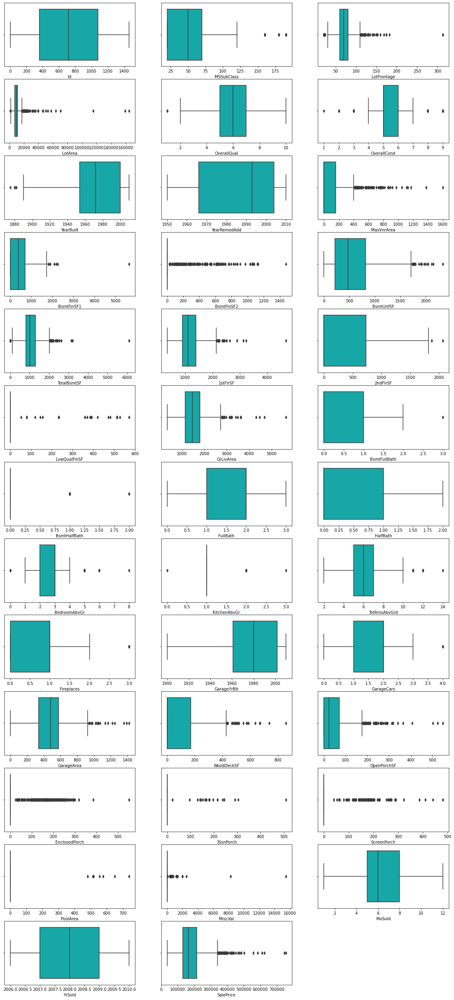

In [313]:
#Relationship Visualizing

plt.figure(figsize = (20,70), facecolor = 'white')
plotnumber = 1

for column in fe3:
    if plotnumber <= 45: # as we see there are 81 columns in the data
        ax = plt.subplot(20,3,plotnumber)
        sn.boxplot(fe3[column], color = 'c')
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

##### As we have seen some variables are having outliers in it.


## Bi variate analysis
Bi variate analysis is works with two variables.

In [314]:
fe5 = train_data[['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'SalePrice']]

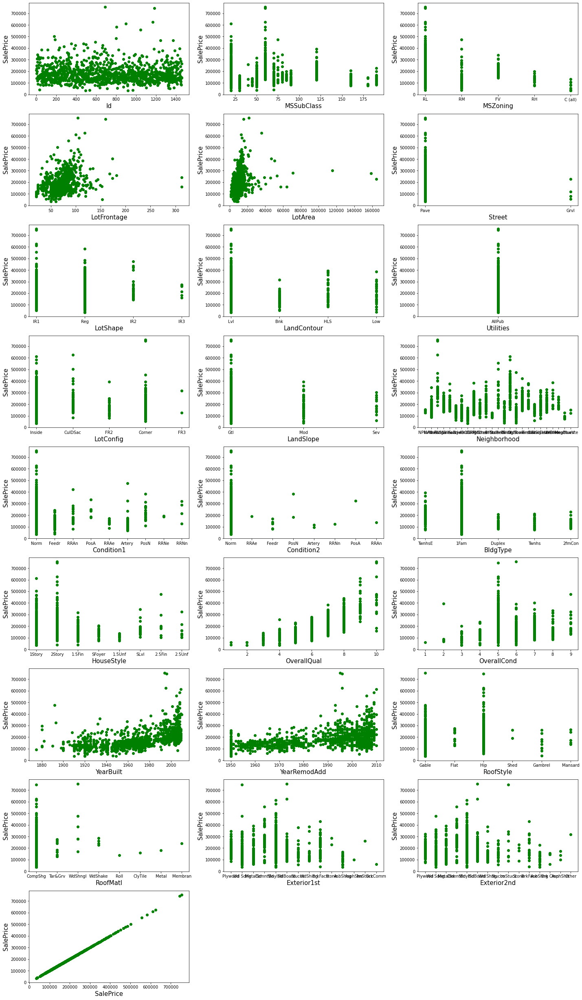

In [315]:
### Relationship Visualizing

plt.figure(figsize = (20,45), facecolor = 'white')
plotnumber = 1

for column in fe5:
    if plotnumber <= 35:
        ax = plt.subplot(12,3,plotnumber)
        plt.scatter(fe5[column],fe5['SalePrice'], color='g')
        plt.xlabel(column,fontsize=15)
        plt.ylabel('SalePrice', fontsize=15)
    plotnumber += 1
plt.tight_layout()

In [316]:
fe6 = train_data[['MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'SalePrice']]

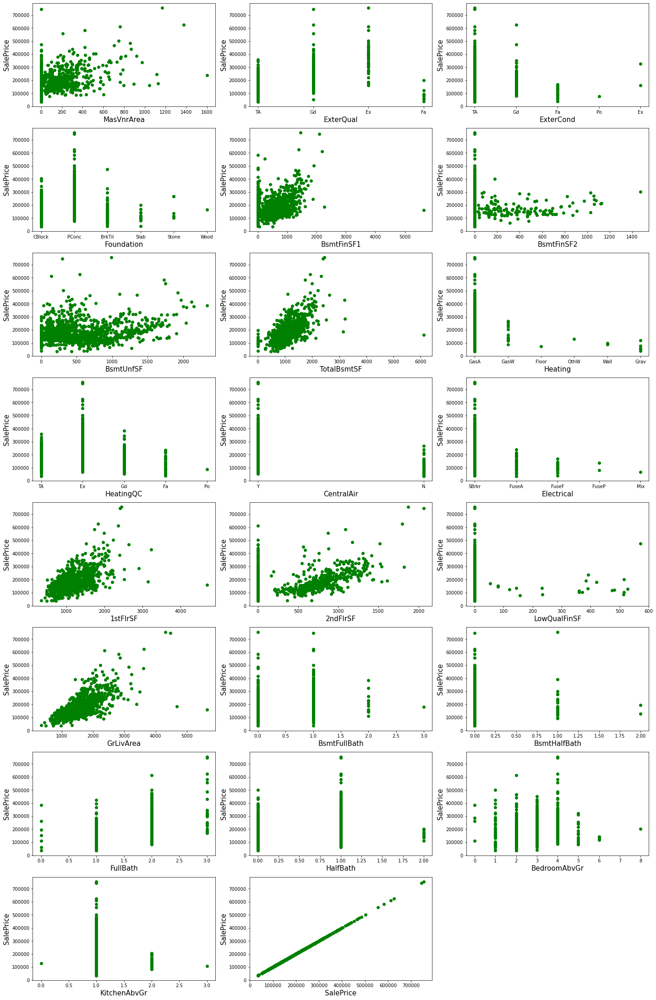

In [317]:
### Relationship Visualizing

plt.figure(figsize = (20,45), facecolor = 'white')
plotnumber = 1

for column in fe6:
    if plotnumber <= 35:
        ax = plt.subplot(12,3,plotnumber)
        plt.scatter(fe6[column],fe6['SalePrice'], color='g')
        plt.xlabel(column,fontsize=15)
        plt.ylabel('SalePrice', fontsize=15)
    plotnumber += 1
plt.tight_layout()

In [318]:
fe7 = train_data[['KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice']]

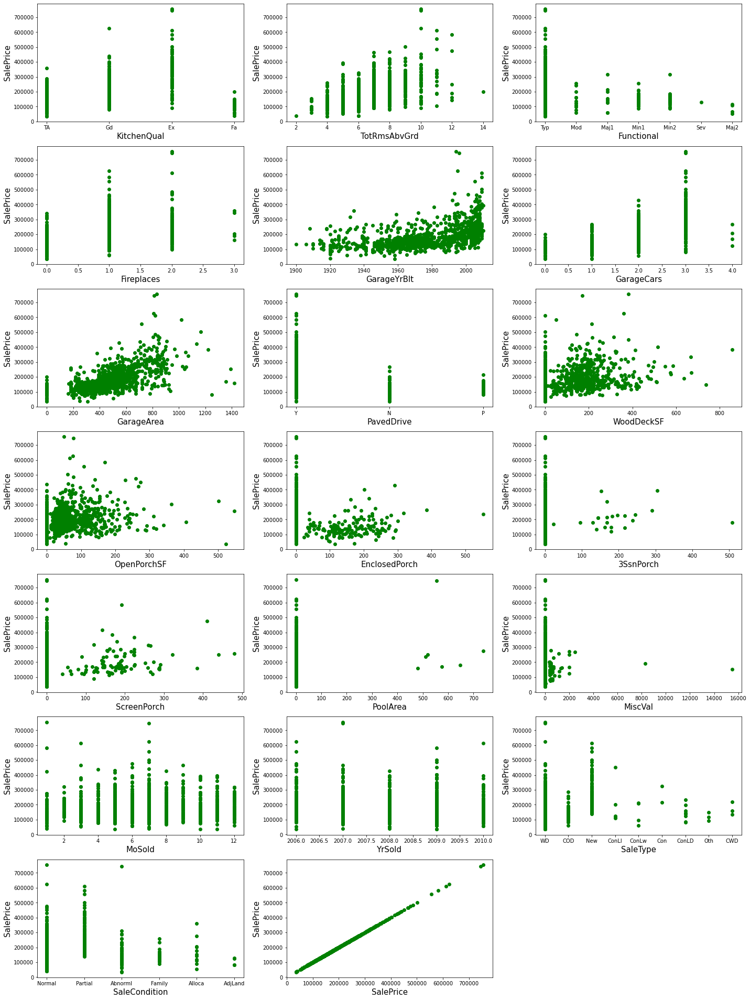

In [319]:
### Relationship Visualizing

plt.figure(figsize = (20,45), facecolor = 'white')
plotnumber = 1

for column in fe7:
    if plotnumber <= 35:
        ax = plt.subplot(12,3,plotnumber)
        plt.scatter(fe7[column],fe7['SalePrice'], color='g')
        plt.xlabel(column,fontsize=15)
        plt.ylabel('SalePrice', fontsize=15)
    plotnumber += 1
plt.tight_layout()

As we have seen in the plot all columns are having categorical data in it with binary classification.

## Multi Variate analysis
Multi variate analysis find the relationship with all variables.
Now we will visualize the data and check the coiefficient of multicollinearity

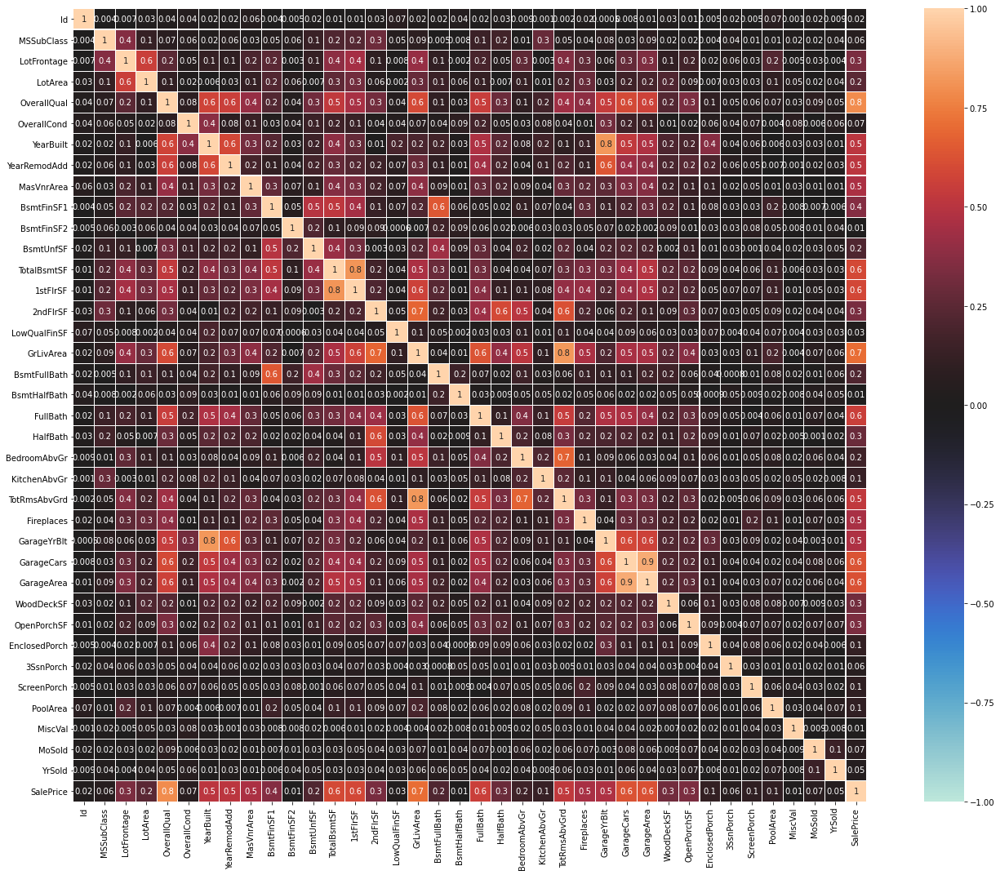

In [320]:
data_cor = train_data.corr().abs()

plt.figure(figsize = (20,15))
sn.heatmap(data_cor, vmin=-1, vmax= 1, annot=True, square=True,
          center=0, fmt='.1g', linewidths=.1)
plt.tight_layout()

# As shown in heatmap overallQual is highly correlated with target variable i. e. SalePricee
# Hence it is an important variable to predict the saleprice
# Through this variable the overall quality of house can be described

##### Find out which columns are positively and negatively correlated with each other

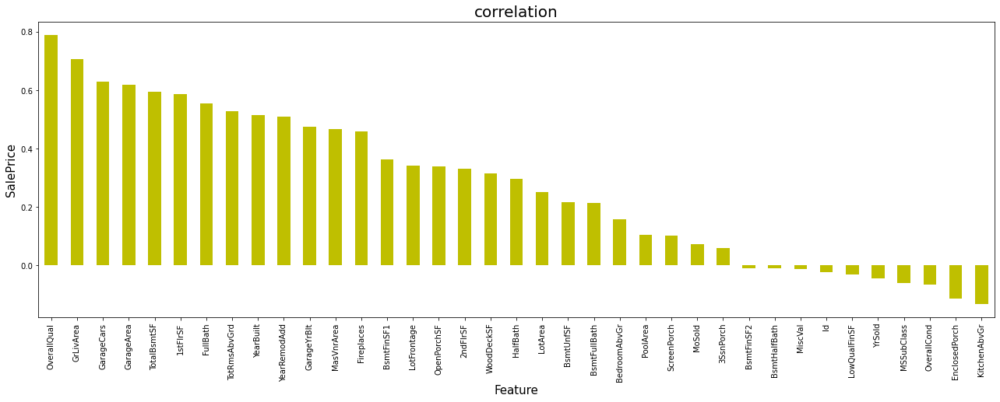

In [321]:
plt.figure(figsize=(22,7))
train_data.corr()['SalePrice'].sort_values(ascending = False).drop(['SalePrice']).plot(kind = 'bar', color = 'y')
plt.xlabel('Feature', fontsize = 15)
plt.ylabel('SalePrice', fontsize = 15)
plt.title('correlation', fontsize = 20)
plt.show()

#### After visualization conclude that all input variables are having some/good amount relationship with target variable. Now proceed futher for next steps:

# Handle Missing value

#### 1. LotFrontage

In [322]:
train_data['LotFrontage'].unique()

array([ nan,  95.,  92., 105.,  58.,  88.,  70.,  80.,  50.,  44., 129.,
        59.,  55.,  64.,  24.,  68.,  71.,  74.,  61.,  60., 120.,  84.,
       141.,  30.,  65.,  76., 100.,  85.,  75., 107., 122.,  82.,  62.,
        73.,  79.,  77.,  41.,  69.,  90.,  96.,  72.,  34.,  78.,  63.,
        40.,  98., 160., 108., 128.,  51.,  81.,  99.,  66.,  37., 174.,
        87.,  53., 152.,  47.,  86.,  56.,  89.,  35.,  52.,  21., 104.,
        57.,  83.,  46., 101., 112., 149.,  93.,  49.,  43., 130.,  54.,
        91.,  67.,  97., 110., 103., 115.,  94.,  48.,  36., 313., 109.,
       144., 121., 102., 116., 182.,  32.,  42., 168., 118.,  38., 140.,
       134., 114., 124.,  39., 111.,  45., 106., 153.])

In [323]:
train_data['LotFrontage']=train_data['LotFrontage'].fillna(train_data['LotFrontage'].mode()[0])

#### 2. Alley

In [324]:
train_data['Alley'].value_counts()

Grvl    41
Pave    36
Name: Alley, dtype: int64

In [325]:
train_data['Alley']=train_data['Alley'].fillna(train_data['Alley'].mode()[0])

#### 3. MasVnrType

In [326]:
train_data['MasVnrType'].value_counts()

None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

In [327]:
train_data['MasVnrType']=train_data['MasVnrType'].fillna(train_data['MasVnrType'].mode()[0])

#### 4. MasVnrArea

In [328]:
train_data['MasVnrArea'].value_counts()

0.0       692
72.0        7
120.0       6
180.0       6
106.0       5
80.0        5
108.0       5
84.0        5
246.0       4
320.0       4
160.0       4
132.0       4
360.0       4
288.0       4
340.0       4
300.0       4
40.0        4
168.0       4
336.0       4
178.0       4
216.0       4
16.0        4
220.0       4
210.0       4
100.0       4
256.0       3
128.0       3
130.0       3
99.0        3
110.0       3
456.0       3
174.0       3
183.0       3
208.0       3
170.0       3
350.0       3
85.0        3
104.0       3
186.0       3
82.0        3
200.0       3
70.0        3
252.0       3
423.0       2
302.0       2
176.0       2
145.0       2
335.0       2
232.0       2
143.0       2
306.0       2
289.0       2
140.0       2
112.0       2
50.0        2
1.0         2
166.0       2
184.0       2
172.0       2
304.0       2
362.0       2
113.0       2
206.0       2
66.0        2
233.0       2
18.0        2
189.0       2
182.0       2
272.0       2
74.0        2
44.0        2
68.0  

In [329]:
train_data['MasVnrArea']=train_data['MasVnrArea'].fillna(train_data['MasVnrArea'].median())

#### 5. BsmtQual

In [330]:
train_data['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [331]:
train_data['BsmtQual']=train_data['BsmtQual'].fillna(train_data['BsmtQual'].mode()[0])

#### 6. BsmtCond

In [332]:
train_data['BsmtCond'].unique()

array(['TA', 'Gd', 'Fa', nan, 'Po'], dtype=object)

In [333]:
train_data['BsmtCond']=train_data['BsmtCond'].fillna(train_data['BsmtCond'].mode()[0])

#### 7. BsmtExposure

In [334]:
train_data['BsmtExposure'].unique()

array(['No', 'Gd', 'Av', 'Mn', nan], dtype=object)

In [335]:
train_data['BsmtExposure']=train_data['BsmtExposure'].fillna(train_data['BsmtExposure'].mode()[0])

#### 8. BsmtFinType1

In [336]:
train_data['BsmtFinType1'].unique()

array(['ALQ', 'GLQ', 'BLQ', 'Unf', 'Rec', 'LwQ', nan], dtype=object)

In [337]:
train_data['BsmtFinType1']=train_data['BsmtFinType1'].fillna(train_data['BsmtFinType1'].mode()[0])

#### 9. BsmtFinType2

In [338]:
train_data['BsmtFinType2'].unique()

array(['Unf', 'Rec', 'BLQ', 'GLQ', nan, 'ALQ', 'LwQ'], dtype=object)

In [339]:
train_data['BsmtFinType2']=train_data['BsmtFinType2'].fillna(train_data['BsmtFinType2'].mode()[0])

#### 10. FireplaceQu

In [340]:
train_data['FireplaceQu'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Ex', 'Po'], dtype=object)

In [341]:
train_data['FireplaceQu']=train_data['FireplaceQu'].fillna(train_data['FireplaceQu'].mode()[0])

#### 11. GarageType

In [342]:
train_data['GarageType'].unique()

array(['Attchd', 'BuiltIn', 'Detchd', 'Basment', nan, '2Types', 'CarPort'],
      dtype=object)

In [343]:
train_data['GarageType']=train_data['GarageType'].fillna(train_data['GarageType'].mode()[0])

#### 12. GarageYrBlt

In [344]:
train_data['GarageYrBlt'].unique()

array([1977., 1970., 1997., 2006., 1957., 1965., 1947., 1937., 2003.,
       1974., 1955., 1923., 2002., 2007., 1987., 2001., 1988., 1950.,
       1961., 1953., 2010., 1922., 1939., 2005., 1991., 1979., 1975.,
       1976., 1978., 1960., 1956., 2004., 1982., 2000., 1948.,   nan,
       1964., 1920., 1930., 1968., 1946., 1992., 1936., 1967., 1989.,
       1959., 1966., 1916., 1941., 1998., 1962., 1926., 1925., 1983.,
       1999., 1969., 1985., 1993., 2008., 1971., 1980., 1945., 1995.,
       1981., 1994., 1949., 1996., 1921., 1963., 1938., 1958., 1935.,
       1940., 1990., 1910., 1954., 1927., 2009., 1986., 1929., 1984.,
       1973., 1924., 1942., 1900., 1931., 1951., 1934., 1972., 1932.,
       1928., 1918., 1908., 1933., 1906., 1914., 1952., 1915.])

In [345]:
train_data['GarageYrBlt']=train_data['GarageYrBlt'].fillna(train_data['GarageYrBlt'].median())

#### 13. GarageFinish

In [346]:
train_data['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [347]:
train_data['GarageFinish']=train_data['GarageFinish'].fillna(train_data['GarageFinish'].mode()[0])

#### 14. GarageQual

In [348]:
train_data['GarageQual'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Ex', 'Po'], dtype=object)

In [349]:
train_data['GarageQual']=train_data['GarageQual'].fillna(train_data['GarageQual'].mode()[0])

#### 15. GarageCond

In [350]:
train_data['GarageCond'].unique()

array(['TA', 'Fa', 'Gd', nan, 'Po', 'Ex'], dtype=object)

In [351]:
train_data['GarageCond']=train_data['GarageCond'].fillna(train_data['GarageCond'].mode()[0])

#### 16. PoolQC

In [352]:
train_data['PoolQC'].unique()

array([nan, 'Ex', 'Gd', 'Fa'], dtype=object)

In [353]:
train_data['PoolQC']=train_data['PoolQC'].fillna(train_data['PoolQC'].mode()[0])

#### 17. Fence

In [354]:
train_data['Fence'].unique()

array([nan, 'MnPrv', 'GdPrv', 'GdWo', 'MnWw'], dtype=object)

In [355]:
train_data['Fence']=train_data['Fence'].fillna(train_data['Fence'].mode()[0])

#### 18. MiscFeature

In [356]:
train_data['MiscFeature'].unique()

array([nan, 'Shed', 'Gar2', 'TenC', 'Othr'], dtype=object)

In [357]:
train_data['MiscFeature']=train_data['MiscFeature'].fillna(train_data['MiscFeature'].mode()[0])

# Encoding and drop column
#### 1. Encode/Drop BusinessTravel column

#### 1. MSZoning

In [358]:
# Check unique values of MSZoning column
train_data['MSZoning'].unique()

array(['RL', 'RM', 'FV', 'RH', 'C (all)'], dtype=object)

In [359]:
#value caounts of MSZoning column
train_data['MSZoning'].value_counts()

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64

In [360]:
928/1168

0.7945205479452054

In [361]:
#As we can see MSZoning column is having 79% similar data so, we can drop that column
#drop MSZoning column
train_data = train_data.drop(['MSZoning'], axis=1)

##### we can see more than 70% data is having similar value so we can drop that columns

#### 2. Street

In [362]:
#value caounts of Street column
train_data['Street'].value_counts()

Pave    1164
Grvl       4
Name: Street, dtype: int64

In [363]:
1164/1168

0.9965753424657534

In [364]:
#As we can see street column is having 99% similar data so, we can drop that column
#drop Street column
train_data = train_data.drop(['Street'], axis=1)

#### 3. Alley

In [365]:
#value caounts of Alley column
train_data['Alley'].value_counts()

Grvl    1132
Pave      36
Name: Alley, dtype: int64

In [366]:
1132/1168

0.9691780821917808

In [367]:
#As we can see Alley column is having 99% similar data so, we can drop that column
#drop Alley column
train_data = train_data.drop(['Alley'], axis=1)

#### 4. LotShape

In [368]:
train_data['LotShape'].value_counts()

Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64

In [369]:
740/1168

0.6335616438356164

#### 5. LandContour

In [370]:
train_data['LandContour'].value_counts()

Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64

In [371]:
1046/1168

0.8955479452054794

In [372]:
#As we can see LandContour column is having 89% similar data so, we can drop that column
#drop LandContour column
train_data = train_data.drop(['LandContour'], axis=1)

#### 6. Utilities

In [373]:
train_data['Utilities'].value_counts()

AllPub    1168
Name: Utilities, dtype: int64

In [374]:
#As we can see Utilities column is having 100% similar data so, we can drop that column
#drop Utilities column
train_data = train_data.drop(['Utilities'], axis=1)

#### 7. LotConfig

In [375]:
train_data['LotConfig'].value_counts()

Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64

In [376]:
842/1168

0.7208904109589042

In [377]:
#As we can see LotConfig column is having 100% similar data so, we can drop that column
#drop LotConfig column
train_data = train_data.drop(['LotConfig'], axis=1)

#### 8. LandSlope

In [378]:
train_data['LandSlope'].value_counts()

Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64

In [379]:
1105/1168

0.9460616438356164

In [380]:
#As we can see LandSlope column is having 94% similar data so, we can drop that column
#drop LandSlope column
train_data = train_data.drop(['LandSlope'], axis=1)

#### 9. Neighborhood

In [381]:
train_data['Neighborhood'].value_counts()

NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64

#### 10. Condition1

In [382]:
train_data['Condition1'].value_counts()

Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64

In [383]:
1005/1168

0.860445205479452

In [384]:
#As we can see Condition1 column is having 86% similar data so, we can drop that column
#drop Condition1 column
train_data = train_data.drop(['Condition1'], axis=1)

#### 11. Condition2

In [385]:
train_data['Condition2'].value_counts()

Norm      1154
Feedr        6
Artery       2
PosN         2
PosA         1
RRNn         1
RRAn         1
RRAe         1
Name: Condition2, dtype: int64

In [386]:
1154/1168

0.988013698630137

In [387]:
#As we can see Condition2 column is having 98% similar data so, we can drop that column
#drop Condition2 column
train_data = train_data.drop(['Condition2'], axis=1)

#### 12.BldgType

In [388]:
train_data['BldgType'].value_counts()

1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64

In [389]:
981/1168

0.8398972602739726

In [390]:
#As we can see BldgType column is having 83% similar data so, we can drop that column
#drop BldgType column
train_data = train_data.drop(['BldgType'], axis=1)

#### 13. HouseStyle

In [391]:
train_data['HouseStyle'].value_counts()

1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64

#### 14. RoofStyle

In [392]:
train_data['RoofStyle'].value_counts()

Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64

In [393]:
915/1168

0.7833904109589042

In [394]:
#As we can see RoofStyle column is having 78% similar data so, we can drop that column
#drop RoofStyle column
train_data = train_data.drop(['RoofStyle'], axis=1)

#### 15. RoofMatl

In [395]:
train_data['RoofMatl'].value_counts()

CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Metal         1
Roll          1
Membran       1
ClyTile       1
Name: RoofMatl, dtype: int64

In [396]:
1144/1168

0.9794520547945206

In [397]:
#As we can see RoofMatl column is having 97% similar data so, we can drop that column
#drop RoofMatl column
train_data = train_data.drop(['RoofMatl'], axis=1)

#### 16. Exterior1st

In [398]:
train_data['Exterior1st'].value_counts()

VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64

#### 17. Exterior2nd

In [399]:
train_data['Exterior2nd'].value_counts()

VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64

#### 18. MasVnrType

In [400]:
train_data['MasVnrType'].value_counts()

None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

#### 19.ExterQual

In [401]:
train_data['ExterQual'].value_counts()

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64

#### 20.ExterCond

In [402]:
train_data['ExterCond'].value_counts()

TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64

In [403]:
1022/1168

0.875

In [404]:
#As we can see ExterCond column is having 87% similar data so, we can drop that column
#drop ExterCond column
train_data = train_data.drop(['ExterCond'], axis=1)

#### 21. Foundation

In [405]:
train_data['Foundation'].value_counts()

CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64

#### 22. BsmtQual

In [406]:
train_data['BsmtQual'].value_counts()

TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

#### 23. BsmtCond

In [407]:
train_data['BsmtCond'].value_counts()

TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

In [408]:
1071/1168

0.9169520547945206

In [409]:
#As we can see BsmtCond column is having 91% similar data so, we can drop that column
#drop BsmtCond column
train_data = train_data.drop(['BsmtCond'], axis=1)

#### 24. BsmtExposure

In [410]:
train_data['BsmtExposure'].value_counts()

No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

In [411]:
787/1168

0.6738013698630136

#### 25. BsmtFinType1

In [412]:
train_data['BsmtFinType1'].value_counts()

Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

#### 26. BsmtFinType2

In [413]:
train_data['BsmtFinType2'].value_counts()

Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [414]:
1033/1168

0.884417808219178

In [415]:
#As we can see BsmtFinType2 column is having 88% similar data so, we can drop that column
#drop BsmtFinType2 column
train_data = train_data.drop(['BsmtFinType2'], axis=1)

#### 27. Heating

In [416]:
train_data['Heating'].value_counts()

GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64

In [417]:
1143/1168

0.978595890410959

In [418]:
#As we can see Heating column is having 97% similar data so, we can drop that column
#drop Heating column
train_data = train_data.drop(['Heating'], axis=1)

#### 28. HeatingQC

In [419]:
train_data['HeatingQC'].value_counts()

Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64

#### 29. CentralAir

In [420]:
train_data['CentralAir'].value_counts()

Y    1090
N      78
Name: CentralAir, dtype: int64

In [421]:
1090/1168

0.9332191780821918

In [422]:
#As we can see CentralAir column is having 93% similar data so, we can drop that column
#drop CentralAir column
train_data = train_data.drop(['CentralAir'], axis=1)

#### 30. Electrical

In [423]:
train_data['Electrical'].value_counts()

SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64

In [424]:
1070/1168

0.916095890410959

In [425]:
#As we can see Electrical column is having 91% similar data so, we can drop that column
#drop Electrical column
train_data = train_data.drop(['Electrical'], axis=1)

#### 31. KitchenQual

In [426]:
train_data['KitchenQual'].value_counts()

TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64

#### 32. Functional

In [427]:
train_data['Functional'].value_counts()

Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64

In [428]:
1085/1168

0.9289383561643836

In [429]:
#As we can see Functional column is having 92% similar data so, we can drop that column
#drop Functional column
train_data = train_data.drop(['Functional'], axis=1)

#### 33. FireplaceQu

In [430]:
train_data['FireplaceQu'].value_counts()

Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

In [431]:
852/1168

0.7294520547945206

In [432]:
#As we can see FireplaceQu column is having 72% similar data so, we can drop that column
#drop FireplaceQu column
train_data = train_data.drop(['FireplaceQu'], axis=1)

#### 34. GarageType

In [433]:
train_data['GarageType'].value_counts()

Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

#### 35. GarageFinish

In [434]:
train_data['GarageFinish'].value_counts()

Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

#### 36. GarageQual

In [435]:
train_data['GarageQual'].value_counts()

TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64

In [436]:
1114/1168

0.9537671232876712

In [437]:
#As we can see GarageQual column is having 95% similar data so, we can drop that column
#drop GarageQual column
train_data = train_data.drop(['GarageQual'], axis=1)

#### 37. GarageCond

In [438]:
train_data['GarageCond'].value_counts()

TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

In [439]:
1125/1168

0.9631849315068494

In [440]:
#As we can see GarageCond column is having 96% similar data so, we can drop that column
#drop GarageCond column
train_data = train_data.drop(['GarageCond'], axis=1)

#### 38. PavedDrive

In [441]:
train_data['PavedDrive'].value_counts()

Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64

In [442]:
1071/1168

0.9169520547945206

In [443]:
#As we can see PavedDrive column is having 91% similar data so, we can drop that column
#drop PavedDrive column
train_data = train_data.drop(['PavedDrive'], axis=1)

#### 39. PoolQC

In [444]:
train_data['PoolQC'].value_counts()

Gd    1164
Fa       2
Ex       2
Name: PoolQC, dtype: int64

In [445]:
1164/1168

0.9965753424657534

In [446]:
#As we can see PoolQC column is having 99% similar data so, we can drop that column
#drop PoolQC column
train_data = train_data.drop(['PoolQC'], axis=1)

#### 40. Fence

In [447]:
train_data['Fence'].value_counts()

MnPrv    1060
GdPrv      51
GdWo       47
MnWw       10
Name: Fence, dtype: int64

In [448]:
1060/1168

0.9075342465753424

In [449]:
#As we can see Fence column is having 90% similar data so, we can drop that column
#drop Fence column
train_data = train_data.drop(['Fence'], axis=1)

#### 41. MiscFeature

In [450]:
train_data['MiscFeature'].value_counts()

Shed    1164
Gar2       2
Othr       1
TenC       1
Name: MiscFeature, dtype: int64

In [451]:
1164/1168

0.9965753424657534

In [452]:
#As we can see MiscFeature column is having 99% similar data so, we can drop that column
#drop MiscFeature column
train_data = train_data.drop(['MiscFeature'], axis=1)

#### 42. SaleType

In [453]:
train_data['SaleType'].value_counts()

WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64

In [454]:
999/1168

0.8553082191780822

In [455]:
#As we can see SaleType column is having 85% similar data so, we can drop that column
#drop SaleType column
train_data = train_data.drop(['SaleType'], axis=1)

#### 43. SaleCondition

In [456]:
train_data['SaleCondition'].value_counts()

Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64

In [457]:
945/1168

0.8090753424657534

In [458]:
#As we can see SaleCondition column is having 80% similar data so, we can drop that column
#drop SaleCondition column
train_data = train_data.drop(['SaleCondition'], axis=1)

#### 44. Id

In [459]:
train_data['Id'].nunique()

1168

In [460]:
# we can see id column is having all unique values. so we can drop that column
train_data = train_data.drop(['Id'], axis=1) 

#### 45. BsmtFinSF2

In [461]:
train_data['BsmtFinSF2'].value_counts()

0       1032
180        5
374        2
290        2
182        2
147        2
117        2
287        2
93         2
468        2
294        2
64         2
41         2
228        1
324        1
184        1
193        1
202        1
208        1
210        1
211        1
311        1
219        1
230        1
306        1
232        1
239        1
240        1
334        1
181        1
264        1
276        1
279        1
258        1
175        1
177        1
121        1
28         1
32         1
35         1
40         1
68         1
80         1
81         1
96         1
106        1
108        1
110        1
123        1
344        1
125        1
127        1
128        1
132        1
139        1
144        1
149        1
150        1
163        1
168        1
173        1
336        1
1474       1
1127       1
791        1
630        1
634        1
645        1
661        1
670        1
682        1
690        1
692        1
712        1
723        1
764        1
768        1

In [462]:
# we can see MasVnrType column is having 88% similar data. so we can drop that column
train_data = train_data.drop(['BsmtFinSF2'], axis=1) 

#As we can see LotArea column is having 79% similar data so, we can drop that column
#drop MSZoning column
train_data = train_data.drop(['LotArea'], axis=1)

#As we can see LowQualFinSF column is having 80% similar data so, we can drop that column
#drop MSZoning column
train_data = train_data.drop(['LowQualFinSF'], axis=1)

#poor correlation with target variable
train_data = train_data.drop(['BsmtHalfBath'], axis=1)
train_data = train_data.drop(['KitchenAbvGr'], axis=1)
train_data = train_data.drop(['EnclosedPorch'], axis=1)
train_data = train_data.drop(['3SsnPorch'], axis=1)
train_data = train_data.drop(['ScreenPorch'], axis=1)
train_data = train_data.drop(['PoolArea'], axis=1)
train_data = train_data.drop(['MiscVal'], axis=1)

### Encode all columns which are having object data type

In [463]:
#import label encoder
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [464]:
for i in train_data.columns:
    if train_data[i].dtypes=="object":
        train_data[i]=le.fit_transform(train_data[i].values.reshape(-1,1))

### after encoding check the correlation with target variable

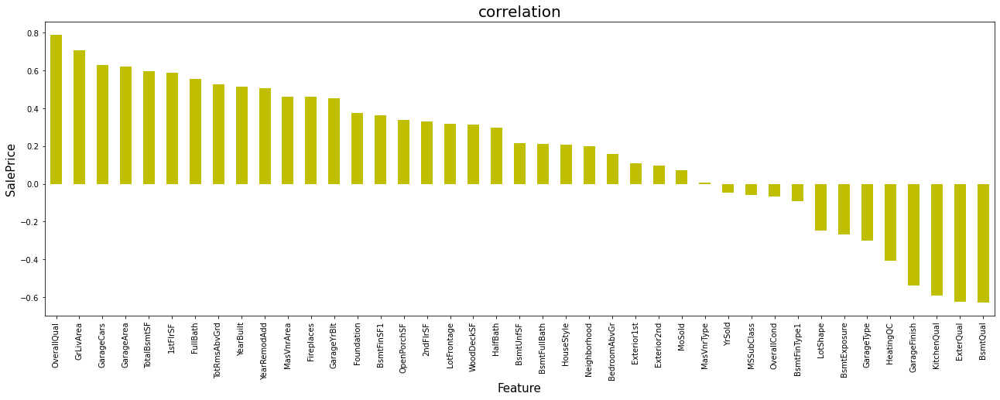

In [465]:
plt.figure(figsize=(22,7))
train_data.corr()['SalePrice'].sort_values(ascending = False).drop(['SalePrice']).plot(kind = 'bar', color = 'y')
plt.xlabel('Feature', fontsize = 15)
plt.ylabel('SalePrice', fontsize = 15)
plt.title('correlation', fontsize = 20)
plt.show()

## Remove outliers

In [466]:
train_data.dtypes

MSSubClass        int64
LotFrontage     float64
LotShape          int32
Neighborhood      int32
HouseStyle        int32
OverallQual       int64
OverallCond       int64
YearBuilt         int64
YearRemodAdd      int64
Exterior1st       int32
Exterior2nd       int32
MasVnrType        int32
MasVnrArea      float64
ExterQual         int32
Foundation        int32
BsmtQual          int32
BsmtExposure      int32
BsmtFinType1      int32
BsmtFinSF1        int64
BsmtUnfSF         int64
TotalBsmtSF       int64
HeatingQC         int32
1stFlrSF          int64
2ndFlrSF          int64
GrLivArea         int64
BsmtFullBath      int64
FullBath          int64
HalfBath          int64
BedroomAbvGr      int64
KitchenQual       int32
TotRmsAbvGrd      int64
Fireplaces        int64
GarageType        int32
GarageYrBlt     float64
GarageFinish      int32
GarageCars        int64
GarageArea        int64
WoodDeckSF        int64
OpenPorchSF       int64
MoSold            int64
YrSold            int64
SalePrice       

as shown in above only 6 columns are contineous in nature.

## 1.Outlier removal using Zscore

In [467]:
#In Zscore technique taking standard deviation 3
#for Zscore outlier removal technique import library from scipy


from scipy.stats import zscore

z_score= zscore(train_data[['LotFrontage', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']])
abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis = 1)

new_train_data = train_data[filtering_entry]

print("shape before and after")
print("shape before".ljust(20),":", train_data.shape)
print("shape after".ljust(20),":", new_train_data.shape)
print("Percentage Loss".ljust(20),":", (train_data.shape[0]-new_train_data.shape[0])/train_data.shape[0])

shape before and after
shape before         : (1168, 42)
shape after          : (1077, 42)
Percentage Loss      : 0.0779109589041096


7.79% data loss after using Zscore technique

In [468]:
(1077/1168)*100

92.20890410958904

92.20% data remains.

In [469]:
new_train_data.describe(include = 'all')

,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,Exterior1st,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000
mean,56.615599,67.233055,1.974002,11.970288,3.007428,6.007428,5.601671,1970.879294,1984.240483,8.621170,...,2.241411,1977.921077,1.264624,1.736305,463.047354,87.443825,40.931291,6.360260,2007.802228,173243.423398
std,41.896146,18.321999,1.406726,6.033291,1.910629,1.310503,1.125126,29.308041,20.959128,3.104954,...,1.777919,23.989393,0.798222,0.723420,199.802036,109.355597,54.465167,2.694518,1.332631,65860.288625
min,20.000000,21.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1882.000000,1950.000000,0.000000,...,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,35311.000000
25%,20.000000,60.000000,0.000000,7.000000,2.000000,5.000000,5.000000,1953.000000,1965.000000,7.000000,...,1.000000,1961.000000,1.000000,1.000000,328.000000,0.000000,0.000000,5.000000,2007.000000,129000.000000
50%,50.000000,63.000000,3.000000,12.000000,2.000000,6.000000,5.000000,1971.000000,1993.000000,11.000000,...,1.000000,1980.000000,1.000000,2.000000,474.000000,0.000000,20.000000,6.000000,2008.000000,159000.000000
75%,70.000000,78.000000,3.000000,17.000000,5.000000,7.000000,6.000000,2000.000000,2004.000000,11.000000,...,5.000000,2001.000000,2.000000,2.000000,576.000000,168.000000,63.000000,8.000000,2009.000000,205000.000000
max,190.000000,134.000000,3.000000,24.000000,7.000000,10.000000,9.000000,2010.000000,2010.000000,13.000000,...,5.000000,2010.000000,2.000000,4.000000,1053.000000,468.000000,244.000000,12.000000,2010.000000,582933.000000


## 2. Outlier Removing using IQR

### from boxplot in EDA, we came to know that outliers present in following columns.

#### Visualize data again to check outliers are present at low side or high side 

In [470]:
train_data2 = train_data

In [471]:
#features in which outliers are detected
fe = train_data2[['LotFrontage', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']]

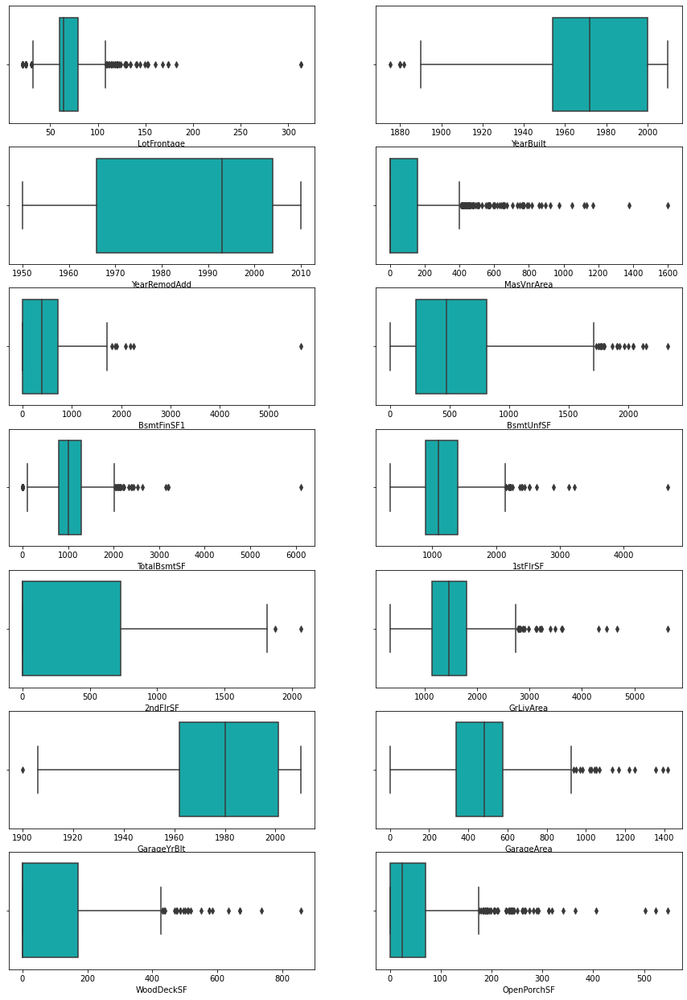

In [472]:
plt.figure(figsize=(15,80))
graph = 1

for column in fe:
    if graph <= 50:
        ax = plt.subplot(25,2, graph)
        sn.boxplot(fe[column], color = 'c')
        plt.xlabel(column, fontsize = 10)
        
    graph+=1
plt.show()

In [473]:
#find the IQR (Inter Quantile Range) to identify outliers
#formula for finding IQR

#1st quantile 25%
q1 = train_data2.quantile(0.25)

#3rd quantile 75%
q3 = train_data2.quantile(0.75)

#IQR = Inter Quantile Range
iqr = q3-q1

## Outlier detection formula 

#### Higher side ==> Q3 + (1.5 * IQR)
#### Lower side ==> Q1 - (1.5 * IQR) 

##### Outliers removal from higher side 

In [474]:
#as shown in boxplot we have outlier in higher side of LotFrontage 
#Remove outliers from higher side so, use higher side formula

LotFrontage_out = (q3.LotFrontage + (1.5*(iqr.LotFrontage)))
LotFrontage_out

108.125

In [475]:
index_out = np.where(train_data2['LotFrontage'] > LotFrontage_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,3,20,105.0,0,14,2,6,6,1977,1977,...,1,1977.0,1,2,546,0,122,1,2010,190000
4,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
5,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
6,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
7,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
8,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
9,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500


after removing outliers from LotFrontage 1121 rows will remains in dataframe.

In [476]:
#as shown in boxplot we have outlier in lower side of LotFrontage 
#Remove outliers from lower side so, use higher side formula

LotFrontage_out = (q1.LotFrontage - (1.5*(iqr.LotFrontage)))
LotFrontage_out

31.125

In [477]:
index_out = np.where(train_data2['LotFrontage'] < LotFrontage_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,3,20,105.0,0,14,2,6,6,1977,1977,...,1,1977.0,1,2,546,0,122,1,2010,190000
4,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
5,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
6,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
7,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
8,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
9,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500


after removing outliers from LotFrontage 1086 rows will remains in dataframe.

In [478]:
#Check the Outliers for YearBuilt
#Remove outliers from higher side so, use higher side formula

YearBuilt_out = (q1.YearBuilt - (1.5*(iqr.YearBuilt)))
YearBuilt_out

1885.0

In [479]:
index_out = np.where(train_data2['YearBuilt'] < YearBuilt_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,3,20,105.0,0,14,2,6,6,1977,1977,...,1,1977.0,1,2,546,0,122,1,2010,190000
4,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
5,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
6,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
7,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
8,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
9,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500


after removing outliers from YearBuilt 1081 rows will remains in dataframe.

In [480]:
#Check the Outliers for MasVnrArea
#Remove outliers from higher side so, use higher side formula

MasVnrArea_out = (q3.MasVnrArea + (1.5*(iqr.MasVnrArea)))
MasVnrArea_out

400.0

In [481]:
index_out = np.where(train_data2['MasVnrArea'] > MasVnrArea_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
4,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
5,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
6,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
7,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
8,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500
9,10,50,50.0,3,9,0,6,6,1937,1950,...,5,1937.0,2,1,198,0,0,6,2006,119500


after removing outliers from MasVnrArea 1015 rows will remains in dataframe.

In [482]:
#Check the Outliers for BsmtFinSF1
#Remove outliers from higher side so, use higher side formula

BsmtFinSF1_out = (q3.BsmtFinSF1 + (1.5*(iqr.BsmtFinSF1)))
BsmtFinSF1_out

1786.25

In [483]:
index_out = np.where(train_data2['BsmtFinSF1'] > BsmtFinSF1_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
4,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
5,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
6,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
7,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
8,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500
9,10,50,50.0,3,9,0,6,6,1937,1950,...,5,1937.0,2,1,198,0,0,6,2006,119500


after removing outliers from BsmtFinSF1 1014 rows will remains in dataframe

In [484]:
#Check the Outliers for BsmtUnfSF
#Remove outliers from higher side so, use higher side formula

BsmtUnfSF_out = (q3.BsmtUnfSF + (1.5*(iqr.BsmtUnfSF)))
BsmtUnfSF_out

1716.0

In [485]:
index_out = np.where(train_data2['BsmtUnfSF'] > BsmtUnfSF_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,1,20,95.0,0,12,2,8,6,1970,1970,...,1,1970.0,2,2,621,81,207,10,2007,268000
2,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
3,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
4,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
5,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
6,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
7,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
8,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500
9,10,50,50.0,3,9,0,6,6,1937,1950,...,5,1937.0,2,1,198,0,0,6,2006,119500


after removing outliers from BsmtUnfSF 878 rows will remains in dataframe

In [486]:
#Check the Outliers for TotalBsmtSF
#Remove outliers from higher side so, use higher side formula

TotalBsmtSF_out = (q3.TotalBsmtSF + (1.5*(iqr.TotalBsmtSF)))
TotalBsmtSF_out

2030.25

In [487]:
index_out = np.where(train_data2['TotalBsmtSF'] > TotalBsmtSF_out)
train_data2 = train_data2.drop(train_data2.index[index_out])
train_data2.shape
train_data2.reset_index()

,index,MSSubClass,LotFrontage,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,0,120,60.0,0,13,2,6,5,1976,1976,...,1,1977.0,1,2,440,0,205,2,2007,128000
1,2,60,92.0,0,15,5,7,5,1996,1997,...,1,1997.0,2,2,455,180,130,6,2007,269790
2,4,20,60.0,0,14,2,6,7,1977,2000,...,1,1977.0,0,2,529,240,0,6,2009,215000
3,5,60,58.0,0,8,5,7,5,2006,2006,...,3,2006.0,0,3,660,100,17,11,2006,219210
4,6,20,60.0,0,19,2,5,6,1957,1996,...,5,1957.0,2,2,528,0,0,5,2010,121500
5,7,20,88.0,3,19,2,5,4,1957,2000,...,1,1957.0,1,2,484,0,0,1,2006,155000
6,8,20,70.0,3,7,2,5,7,1965,1965,...,5,1965.0,2,2,461,0,0,4,2007,140000
7,9,50,80.0,3,12,0,5,5,1947,1950,...,5,1947.0,2,1,336,158,0,10,2008,118500
8,10,50,50.0,3,9,0,6,6,1937,1950,...,5,1937.0,2,1,198,0,0,6,2006,119500
9,11,60,44.0,0,5,5,7,6,2003,2003,...,1,2003.0,1,2,613,192,39,1,2010,237000


after removing outliers 994 rows will remain in dataset.

#### After removing outliers from some columns using IQR technique there are 846 rows will remains in dataset. which is very less compare to zscore
#### due to that too much data already lost. so we will go wil zscore technique

In [488]:
((1168-994)/1168)*100

14.897260273972604

14.89% data loss in IQR method till now which is very big data loss

### After applying Zscore and IQR technique to remove outliers. We conclude that less amount data will loss in Zscore technique so we will go with Zscore technique 

## Check the skewness and remove that

In [489]:
new_train_data.skew()

MSSubClass      1.392410
LotFrontage     0.405346
LotShape       -0.660228
Neighborhood    0.087699
HouseStyle      0.327393
OverallQual     0.038399
OverallCond     0.522177
YearBuilt      -0.481104
YearRemodAdd   -0.452090
Exterior1st    -0.599334
Exterior2nd    -0.584191
MasVnrType     -0.135830
MasVnrArea      1.675411
ExterQual      -1.784216
Foundation     -0.080053
BsmtQual       -1.385441
BsmtExposure   -1.213982
BsmtFinType1   -0.080131
BsmtFinSF1      0.644514
BsmtUnfSF       0.809443
TotalBsmtSF     0.043387
HeatingQC       0.419059
1stFlrSF        0.614891
2ndFlrSF        0.770252
GrLivArea       0.540879
BsmtFullBath    0.626419
FullBath        0.032919
HalfBath        0.743557
BedroomAbvGr    0.092209
KitchenQual    -1.449477
TotRmsAbvGrd    0.562432
Fireplaces      0.698142
GarageType      0.812400
GarageYrBlt    -0.615331
GarageFinish   -0.511179
GarageCars     -0.395424
GarageArea     -0.111577
WoodDeckSF      1.011928
OpenPorchSF     1.478725
MoSold          0.237320


As we see there are some variables are skewed, whoes value is not lies between -0.5 to +0.5 this range.
- LotArea
- YearBuilt
- MasVnrArea
- BsmtFinSF1
- BsmtFinSF2
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- LowQualFinSF
- GrLivArea
- GarageYrBlt
- WoodDeckSF
- OpenPorchSF
- EnclosedPorch
- 3SsnPorch
- ScreenPorch
- MiscVal

But we need to find skewness in only contineous data columns. So, we need to remove skewness on that.

and maximum columns contains categorical values. so no need to remove skewness from that.

### Check outliers datatype. If data types of skewed column is catogorical than no need to remove skewness from that variable.

## Apply yeo-johnson transformation methode to remove skewness

In log transformation, we will take the log of Continues skewed data and convert that into normal data(distribution)/less skewed data and in power transformation we will take the mean value in place of 0th value.

In [490]:
#applying log transformation on skewed columns
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method = 'yeo-johnson')

new_train_data['YearBuilt'] = scaler.fit_transform(new_train_data['YearBuilt'].values.reshape(-1,1))
new_train_data['MasVnrArea'] = scaler.fit_transform(new_train_data['MasVnrArea'].values.reshape(-1,1))
new_train_data['BsmtFinSF1'] = scaler.fit_transform(new_train_data['BsmtFinSF1'].values.reshape(-1,1))
new_train_data['BsmtUnfSF'] = scaler.fit_transform(new_train_data['BsmtUnfSF'].values.reshape(-1,1))
new_train_data['1stFlrSF'] = scaler.fit_transform(new_train_data['1stFlrSF'].values.reshape(-1,1))
new_train_data['2ndFlrSF'] = scaler.fit_transform(new_train_data['2ndFlrSF'].values.reshape(-1,1))
new_train_data['GrLivArea'] = scaler.fit_transform(new_train_data['GrLivArea'].values.reshape(-1,1))
new_train_data['GarageYrBlt'] = scaler.fit_transform(new_train_data['GarageYrBlt'].values.reshape(-1,1))
new_train_data['WoodDeckSF'] = scaler.fit_transform(new_train_data['WoodDeckSF'].values.reshape(-1,1))
new_train_data['OpenPorchSF'] = scaler.fit_transform(new_train_data['OpenPorchSF'].values.reshape(-1,1))

In [491]:
new_train_data.skew()

MSSubClass      1.392410
LotFrontage     0.405346
LotShape       -0.660228
Neighborhood    0.087699
HouseStyle      0.327393
OverallQual     0.038399
OverallCond     0.522177
YearBuilt      -0.109407
YearRemodAdd   -0.452090
Exterior1st    -0.599334
Exterior2nd    -0.584191
MasVnrType     -0.135830
MasVnrArea      0.471453
ExterQual      -1.784216
Foundation     -0.080053
BsmtQual       -1.385441
BsmtExposure   -1.213982
BsmtFinType1   -0.080131
BsmtFinSF1     -0.416576
BsmtUnfSF      -0.313508
TotalBsmtSF     0.043387
HeatingQC       0.419059
1stFlrSF       -0.003375
2ndFlrSF        0.334793
GrLivArea      -0.006048
BsmtFullBath    0.626419
FullBath        0.032919
HalfBath        0.743557
BedroomAbvGr    0.092209
KitchenQual    -1.449477
TotRmsAbvGrd    0.562432
Fireplaces      0.698142
GarageType      0.812400
GarageYrBlt    -0.124266
GarageFinish   -0.511179
GarageCars     -0.395424
GarageArea     -0.111577
WoodDeckSF      0.131374
OpenPorchSF     0.034909
MoSold          0.237320


<AxesSubplot:xlabel='YearBuilt', ylabel='Density'>

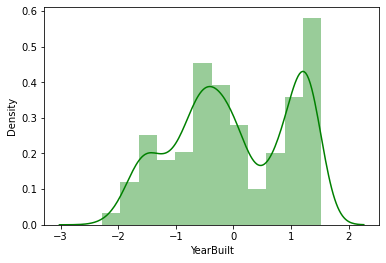

In [492]:
sn.distplot(new_train_data['YearBuilt'], color = 'g')     

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

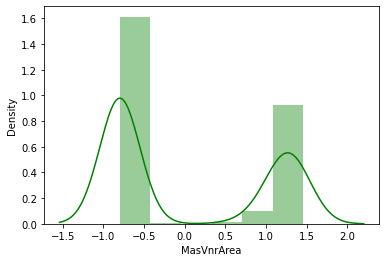

In [493]:
sn.distplot(new_train_data['MasVnrArea'], color = 'g')     

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='Density'>

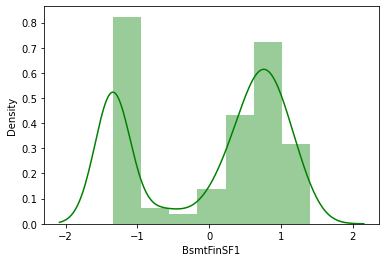

In [494]:
sn.distplot(new_train_data['BsmtFinSF1'], color = 'g')     

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='Density'>

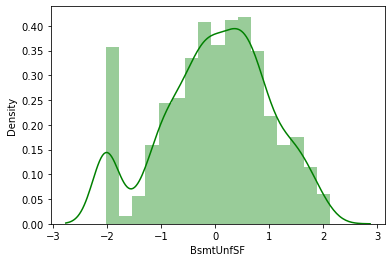

In [495]:
sn.distplot(new_train_data['BsmtUnfSF'], color = 'g')     

<AxesSubplot:xlabel='1stFlrSF', ylabel='Density'>

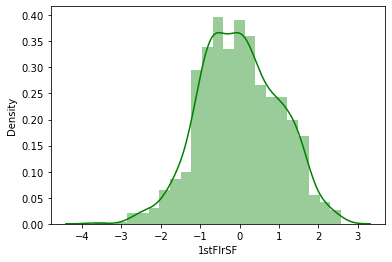

In [496]:
sn.distplot(new_train_data['1stFlrSF'], color = 'g')     

<AxesSubplot:xlabel='2ndFlrSF', ylabel='Density'>

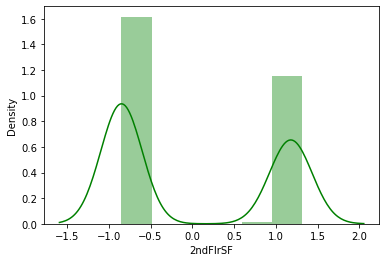

In [497]:
sn.distplot(new_train_data['2ndFlrSF'], color = 'g')     

<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

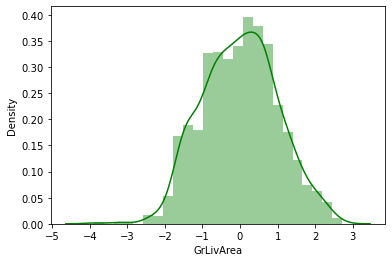

In [498]:
sn.distplot(new_train_data['GrLivArea'], color = 'g')     

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

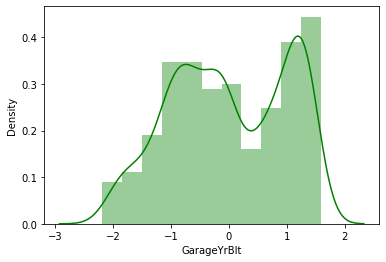

In [499]:
sn.distplot(new_train_data['GarageYrBlt'], color = 'g')     

<AxesSubplot:xlabel='WoodDeckSF', ylabel='Density'>

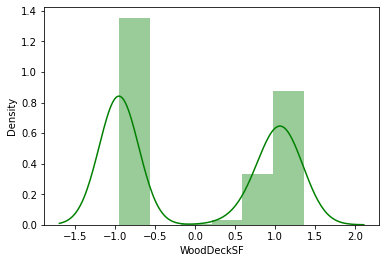

In [500]:
sn.distplot(new_train_data['WoodDeckSF'], color = 'g')     

<AxesSubplot:xlabel='OpenPorchSF', ylabel='Density'>

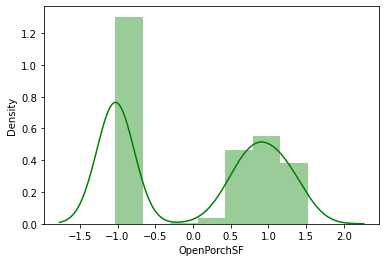

In [501]:
sn.distplot(new_train_data['OpenPorchSF'], color = 'g')     

### after applying yeo-johnson transformation method we can see the skewness get removed/reduced. now, its safe to proceed

# Test dataset

In [502]:
#Import the dataset

test_data= pd.read_csv(r"C:\Users\Chaitali Nakade\OneDrive\Desktop\dataset\housing project\test.csv")
test_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


Importing the test dataset and see all columns with first five rows.

## Shape of data with number of rows and columns

In [503]:
test_data.shape

(292, 80)

There are 292 Rows and 80 Columns in training dataset

## Basic information of dataset

In [504]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

- With this instruction we will get the basic information like is there any null value present in whole dataset, datatypes of all column and non-null values of column and column names. As shown in output there is null values present some columns in dataset.
- Simultaneously we can find here only four columns are having floating data types, 34 columns are having integer datatype and other 42 columns are having object data type.

## Detailed description test dataset

In [505]:
test_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,MiscVal,MoSold,YrSold
count,292.000000,292.000000,247.000000,292.000000,292.000000,292.000000,292.000000,292.000000,291.000000,292.000000,...,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,0.0,292.000000,292.000000,292.000000
mean,755.955479,57.414384,66.425101,10645.143836,6.078767,5.493151,1972.616438,1985.294521,109.171821,439.294521,...,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,NaN,28.184932,6.232877,2007.859589
std,442.565228,43.780649,21.726343,13330.669795,1.356147,1.063267,30.447016,20.105792,175.030021,429.559675,...,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,NaN,224.036218,2.774556,1.322867
min,6.000000,20.000000,21.000000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,1.000000,2006.000000
25%,377.750000,20.000000,53.500000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,4.000000,2007.000000
50%,778.000000,50.000000,65.000000,9200.000000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,...,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,6.000000,2008.000000
75%,1152.250000,70.000000,79.000000,11658.750000,7.000000,6.000000,2001.000000,2003.250000,180.000000,700.500000,...,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,NaN,0.000000,8.000000,2009.000000
max,1456.000000,190.000000,150.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,...,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,NaN,3500.000000,12.000000,2010.000000


We can see the detailed description of all the rows and columns like count, mean value, standard deviation, minimum and maximum value of dataset.

## Checking is there any null value

In [506]:
#check is there any null value present in any column
test_data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

- There are so many column are having missing values in dataset.
- LotFrontage 45
- Alley 278
- MasVnrType 1
- MasVnrArea 1
- BsmtQual 7
- BsmtCond 7
- BsmtExposure 7
- BsmtFinType1 7
- BsmtFinType2 7
- Electrical 1 
- GarageType 17
- GarageYrBlt 17
- GarageFinish 17
- GarageQual 17
- GarageCond 17
- PoolQC 292
- Fence 248
- MiscFeature 282

## Visualization (Uni Variate analysis)
Uni variate analysis works with only one variable, hence it is called uni variate.

In [507]:
te = test_data[['MSZoning', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'BsmtQual', 'BsmtCond']]

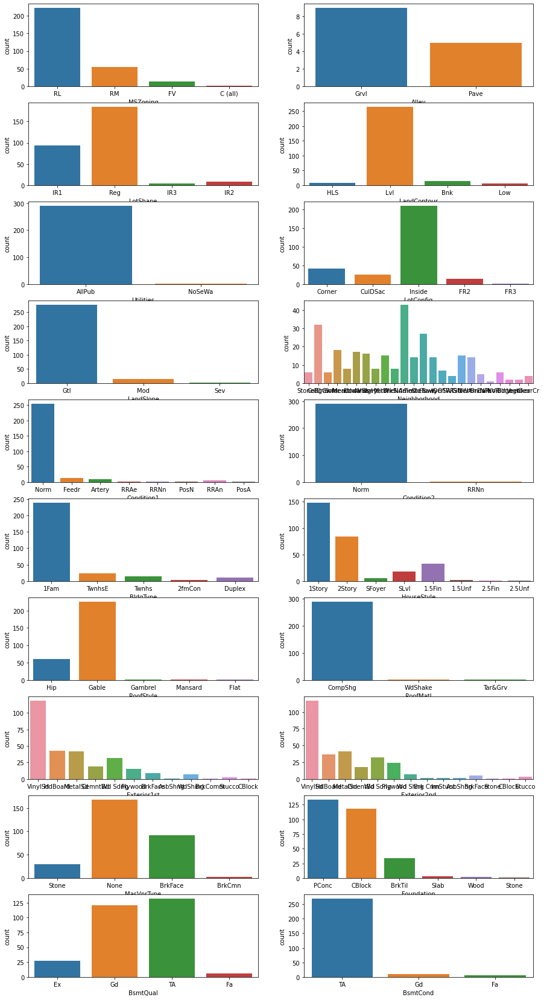

In [508]:
plt.figure(figsize = (15,90), facecolor = 'white')
plotnumber = 1

for column in te:
    if plotnumber <= 25: # as we see there are 81 columns in the data
        ax = plt.subplot(30,2,plotnumber)
        sn.countplot(te[column])
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

In [509]:
te2 = test_data[['BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']]

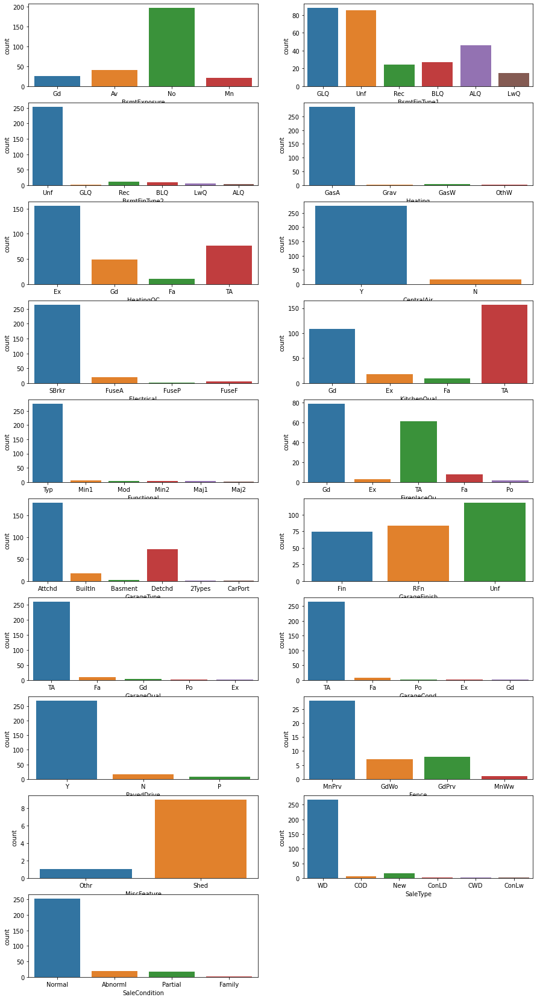

In [510]:
plt.figure(figsize = (15,90), facecolor = 'white')
plotnumber = 1

for column in te2:
    if plotnumber <= 25: # as we see there are 81 columns in the data
        ax = plt.subplot(30,2,plotnumber)
        sn.countplot(te2[column])
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

In [511]:
te3 = test_data[['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']]

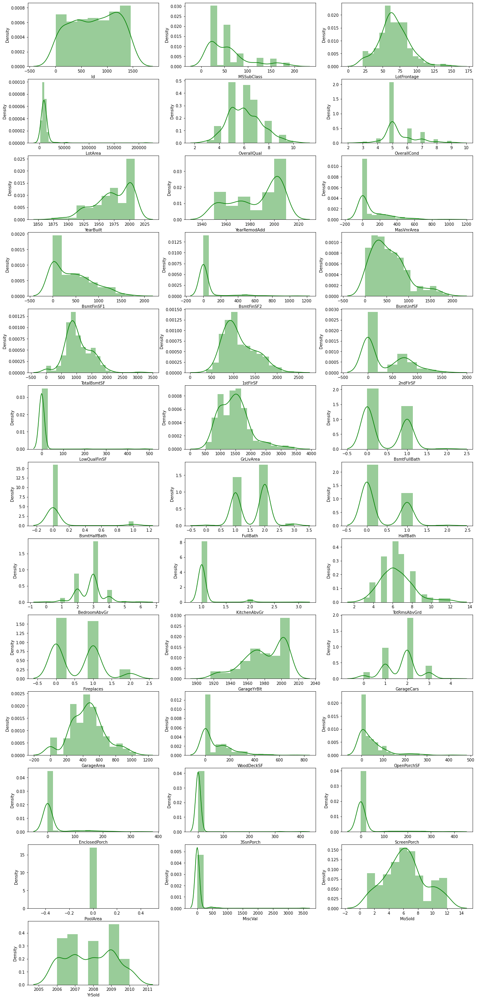

In [512]:
#Relationship Visualizing

plt.figure(figsize = (20,70), facecolor = 'white')
plotnumber = 1

for column in te3:
    if plotnumber <= 45: # as we see there are 81 columns in the data
        ax = plt.subplot(20,3,plotnumber)
        sn.distplot(te3[column], color = 'g')
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

### Analysis through boxplot

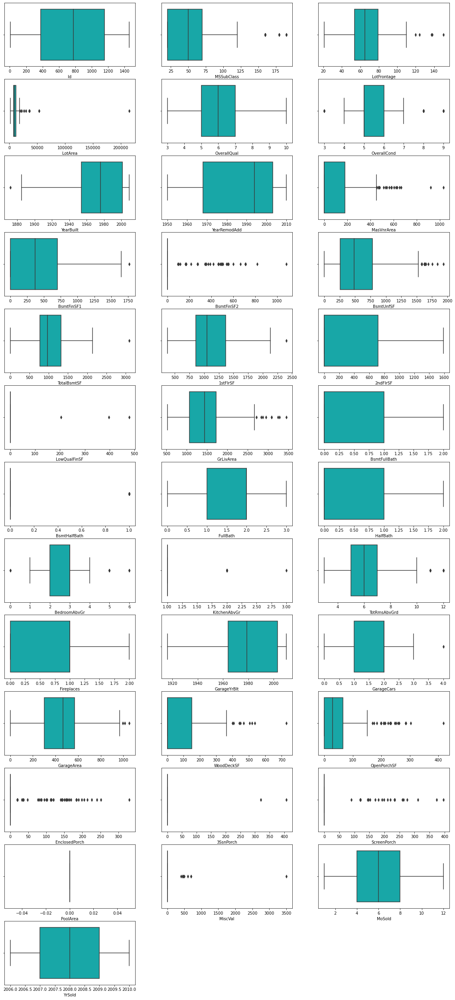

In [513]:
#Relationship Visualizing

plt.figure(figsize = (20,70), facecolor = 'white')
plotnumber = 1

for column in te3:
    if plotnumber <= 45: # as we see there are 81 columns in the data
        ax = plt.subplot(20,3,plotnumber)
        sn.boxplot(te3[column], color = 'c')
        plt.xlabel(column,fontsize=10)
        
    plotnumber += 1
plt.show()

### Multi Variate analysis

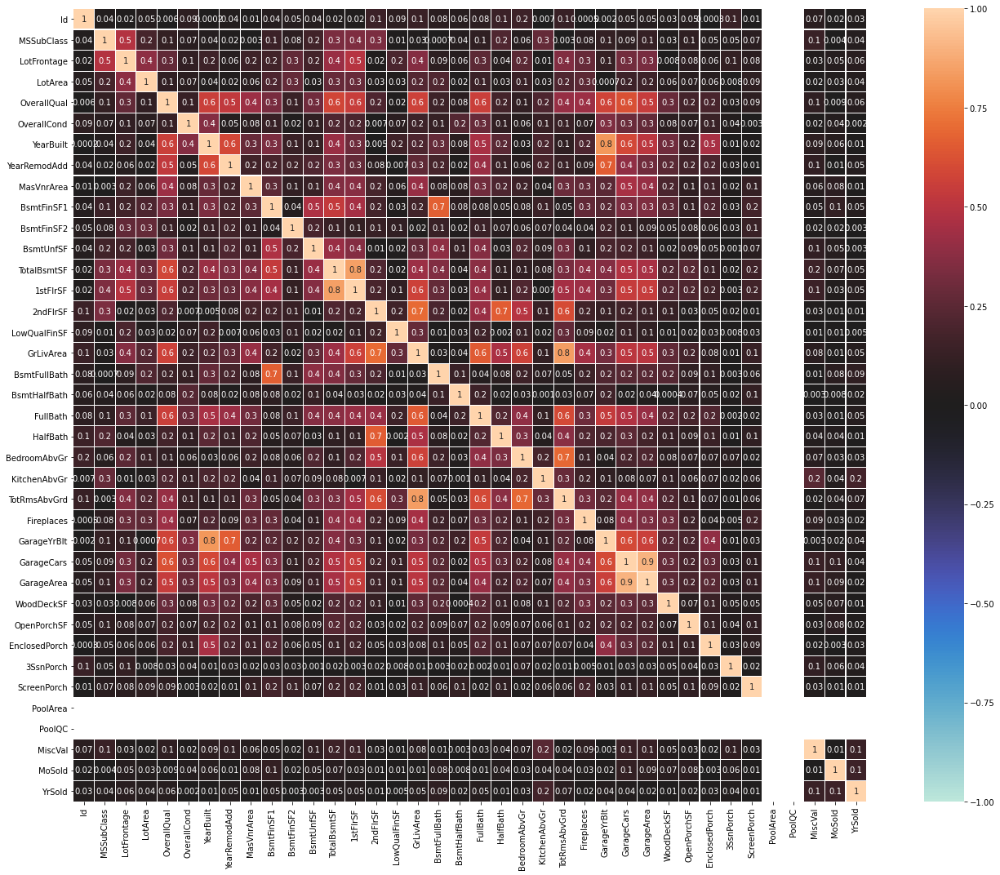

In [514]:
test_data_cor = test_data.corr().abs()

plt.figure(figsize = (20,15))
sn.heatmap(test_data_cor, vmin=-1, vmax= 1, annot=True, square=True,
          center=0, fmt='.1g', linewidths=.1)
plt.tight_layout()

## Handle Missing value

In [515]:
test_data['LotFrontage']=test_data['LotFrontage'].fillna(test_data['LotFrontage'].mode()[0])
test_data['Alley']=test_data['Alley'].fillna(test_data['Alley'].mode()[0])
test_data['MasVnrType']=test_data['MasVnrType'].fillna(test_data['MasVnrType'].mode()[0])
test_data['MasVnrArea']=test_data['MasVnrArea'].fillna(test_data['MasVnrArea'].median())
test_data['BsmtQual']=test_data['BsmtQual'].fillna(test_data['BsmtQual'].mode()[0])
test_data['BsmtCond']=test_data['BsmtCond'].fillna(test_data['BsmtCond'].mode()[0])
test_data['BsmtExposure']=test_data['BsmtExposure'].fillna(test_data['BsmtExposure'].mode()[0])
test_data['BsmtFinType1']=test_data['BsmtFinType1'].fillna(test_data['BsmtFinType1'].mode()[0])
test_data['BsmtFinType2']=test_data['BsmtFinType2'].fillna(test_data['BsmtFinType2'].mode()[0])
test_data['Electrical']=test_data['Electrical'].fillna(test_data['Electrical'].mode()[0])
test_data['GarageType']=test_data['GarageType'].fillna(test_data['GarageType'].mode()[0])
test_data['GarageYrBlt']=test_data['GarageYrBlt'].fillna(test_data['GarageYrBlt'].median())
test_data['GarageFinish']=test_data['GarageFinish'].fillna(test_data['GarageFinish'].mode()[0])
test_data['GarageQual']=test_data['GarageQual'].fillna(test_data['GarageQual'].mode()[0])
test_data['GarageCond']=test_data['GarageCond'].fillna(test_data['GarageCond'].mode()[0])
test_data['Fence']=test_data['Fence'].fillna(test_data['Fence'].mode()[0])
test_data['MiscFeature']=test_data['MiscFeature'].fillna(test_data['MiscFeature'].mode()[0])

## # Encoding and drop column

In [516]:
test_data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [517]:
test_data = test_data.drop(['Id'], axis=1)
test_data = test_data.drop(['MSZoning'], axis=1)
test_data = test_data.drop(['LotArea'], axis=1)
test_data = test_data.drop(['Street'], axis=1)
test_data = test_data.drop(['Alley'], axis=1)
test_data = test_data.drop(['LandContour'], axis=1)
test_data = test_data.drop(['Utilities'], axis=1)
test_data = test_data.drop(['LotConfig'], axis=1)
test_data = test_data.drop(['LandSlope'], axis=1)
test_data = test_data.drop(['Condition1'], axis=1)
test_data = test_data.drop(['Condition2'], axis=1)
test_data = test_data.drop(['BldgType'], axis=1)
test_data = test_data.drop(['RoofStyle'], axis=1)
test_data = test_data.drop(['RoofMatl'], axis=1)
test_data = test_data.drop(['ExterCond'], axis=1)
test_data = test_data.drop(['BsmtCond'], axis=1)
test_data = test_data.drop(['BsmtFinSF2'], axis=1)
test_data = test_data.drop(['BsmtFinType2'], axis=1)
test_data = test_data.drop(['Heating'], axis=1)
test_data = test_data.drop(['CentralAir'], axis=1)
test_data = test_data.drop(['Electrical'], axis=1)
test_data = test_data.drop(['LowQualFinSF'], axis=1)
test_data = test_data.drop(['BsmtHalfBath'], axis=1)
test_data = test_data.drop(['KitchenAbvGr'], axis=1)
test_data = test_data.drop(['Functional'], axis=1)
test_data = test_data.drop(['FireplaceQu'], axis=1)
test_data = test_data.drop(['GarageQual'], axis=1)
test_data = test_data.drop(['GarageCond'], axis=1)
test_data = test_data.drop(['PavedDrive'], axis=1)
test_data = test_data.drop(['EnclosedPorch'], axis=1)
test_data = test_data.drop(['3SsnPorch'], axis=1)
test_data = test_data.drop(['ScreenPorch'], axis=1)
test_data = test_data.drop(['PoolArea'], axis=1)
test_data = test_data.drop(['PoolQC'], axis=1)
test_data = test_data.drop(['Fence'], axis=1)
test_data = test_data.drop(['MiscFeature'], axis=1)
test_data = test_data.drop(['MiscVal'], axis=1)
test_data = test_data.drop(['SaleType'], axis=1)
test_data = test_data.drop(['SaleCondition'], axis=1)

### Encode all columns which are having object data type

In [518]:
#import label encoder
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [519]:
for i in test_data.columns:
    if test_data[i].dtypes=="object":
        test_data[i]=le.fit_transform(test_data[i].values.reshape(-1,1))

## Remove outliers

## 1.Outlier removal using Zscore

In [520]:
#In Zscore technique taking standard deviation 3
#for Zscore outlier removal technique import library from scipy


from scipy.stats import zscore

z_score= zscore(test_data[['LotFrontage', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF']])
abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis = 1)

new_test_data = test_data[filtering_entry]

print("shape before and after")
print("shape before".ljust(20),":", test_data.shape)
print("shape after".ljust(20),":", new_test_data.shape)
print("Percentage Loss".ljust(20),":", (test_data.shape[0]-new_test_data.shape[0])/test_data.shape[0])

shape before and after
shape before         : (292, 41)
shape after          : (265, 41)
Percentage Loss      : 0.09246575342465753


9.24% data lost in zscore technique

## Check the skewness and remove it

In [521]:
new_test_data.skew()

MSSubClass      1.360717
LotFrontage     0.057716
LotShape       -0.681115
Neighborhood    0.086508
HouseStyle      0.363027
OverallQual     0.304969
OverallCond     1.210832
YearBuilt      -0.683693
YearRemodAdd   -0.499923
Exterior1st    -0.615304
Exterior2nd    -0.653573
MasVnrType     -0.013857
MasVnrArea      1.589233
ExterQual      -1.856565
Foundation      0.353074
BsmtQual       -1.381419
BsmtExposure   -1.394580
BsmtFinType1    0.013829
BsmtFinSF1      0.762431
BsmtUnfSF       0.868841
TotalBsmtSF     0.160568
HeatingQC       0.406099
1stFlrSF        0.687003
2ndFlrSF        0.659586
GrLivArea       0.598782
BsmtFullBath    0.469946
FullBath       -0.174433
HalfBath        0.836329
BedroomAbvGr    0.002974
KitchenQual    -1.487943
TotRmsAbvGrd    0.603022
Fireplaces      0.575145
GarageType      0.843828
GarageYrBlt    -0.682350
GarageFinish   -0.535044
GarageCars     -0.295513
GarageArea      0.118340
WoodDeckSF      1.253814
OpenPorchSF     1.656930
MoSold          0.166004


## Applying yeo-johnson transformation methode to remove skewness

In [522]:
#applying log transformation on skewed columns
from sklearn.preprocessing import PowerTransformer 
scaler = PowerTransformer(method = 'yeo-johnson')

new_test_data['YearBuilt'] = scaler.fit_transform(new_test_data['YearBuilt'].values.reshape(-1,1))
new_test_data['YearRemodAdd'] = scaler.fit_transform(new_test_data['YearRemodAdd'].values.reshape(-1,1))
new_test_data['MasVnrArea'] = scaler.fit_transform(new_test_data['MasVnrArea'].values.reshape(-1,1))
new_test_data['BsmtFinSF1'] = scaler.fit_transform(new_test_data['BsmtFinSF1'].values.reshape(-1,1))
new_test_data['BsmtUnfSF'] = scaler.fit_transform(new_test_data['BsmtUnfSF'].values.reshape(-1,1))
new_test_data['1stFlrSF'] = scaler.fit_transform(new_test_data['1stFlrSF'].values.reshape(-1,1))
new_test_data['2ndFlrSF'] = scaler.fit_transform(new_test_data['2ndFlrSF'].values.reshape(-1,1))
new_test_data['GrLivArea'] = scaler.fit_transform(new_test_data['GrLivArea'].values.reshape(-1,1))
new_test_data['GarageYrBlt'] = scaler.fit_transform(new_test_data['GarageYrBlt'].values.reshape(-1,1))
new_test_data['WoodDeckSF'] = scaler.fit_transform(new_test_data['WoodDeckSF'].values.reshape(-1,1))
new_test_data['OpenPorchSF'] = scaler.fit_transform(new_test_data['OpenPorchSF'].values.reshape(-1,1))

In [523]:
new_test_data.skew()

MSSubClass      1.360717
LotFrontage     0.057716
LotShape       -0.681115
Neighborhood    0.086508
HouseStyle      0.363027
OverallQual     0.304969
OverallCond     1.210832
YearBuilt      -0.165726
YearRemodAdd   -0.218578
Exterior1st    -0.615304
Exterior2nd    -0.653573
MasVnrType     -0.013857
MasVnrArea      0.428986
ExterQual      -1.856565
Foundation      0.353074
BsmtQual       -1.381419
BsmtExposure   -1.394580
BsmtFinType1    0.013829
BsmtFinSF1     -0.420318
BsmtUnfSF      -0.280708
TotalBsmtSF     0.160568
HeatingQC       0.406099
1stFlrSF       -0.000400
2ndFlrSF        0.273840
GrLivArea      -0.009368
BsmtFullBath    0.469946
FullBath       -0.174433
HalfBath        0.836329
BedroomAbvGr    0.002974
KitchenQual    -1.487943
TotRmsAbvGrd    0.603022
Fireplaces      0.575145
GarageType      0.843828
GarageYrBlt    -0.139435
GarageFinish   -0.535044
GarageCars     -0.295513
GarageArea      0.118340
WoodDeckSF      0.252163
OpenPorchSF    -0.054559
MoSold          0.166004


### after applying yeo-johnson transformation method we can see the skewness get removed/reduced. now, its safe to proceed

## Seperating the columns into featuers and target:

#### x= features, y=Target 

In [524]:
x = new_train_data.drop(columns = 'SalePrice', axis=1)
y = new_train_data['SalePrice']
x1 = new_test_data

test dataset and train dataset are scalled now

## Scalling technique

In [525]:
#import Libraries
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
x_scaled = ss.fit_transform(x)
x1_scalar = ss.fit_transform(x1)

## Variance inflation factor

In [526]:
#import libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scaled, i) for i in range(x_scaled.shape[1])]
vif["Features"] = x.columns

#lets check the values
vif

,vif,Features
0,1.831373,MSSubClass
1,1.625219,LotFrontage
2,1.150210,LotShape
3,1.163556,Neighborhood
4,2.125277,HouseStyle
5,3.491911,OverallQual
6,1.767199,OverallCond
7,8.185800,YearBuilt
8,2.883362,YearRemodAdd
9,4.364474,Exterior1st


as we see above vif value of all columns is not less than 10. so we need drop that columns.

In [527]:
new_train_data= new_train_data.drop(['GrLivArea'], axis=1)
new_train_data= new_train_data.drop(['YearBuilt'], axis=1)

In [528]:
x = new_train_data.drop(columns = 'SalePrice', axis=1)
y = new_train_data['SalePrice']

In [529]:
#import Libraries
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
x_scaled = ss.fit_transform(x)

In [530]:
#import libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scaled, i) for i in range(x_scaled.shape[1])]
vif["Features"] = x.columns

#lets check the values
vif

,vif,Features
0,1.815765,MSSubClass
1,1.621251,LotFrontage
2,1.146004,LotShape
3,1.161575,Neighborhood
4,2.010605,HouseStyle
5,3.261601,OverallQual
6,1.570230,OverallCond
7,2.690372,YearRemodAdd
8,4.359437,Exterior1st
9,4.399367,Exterior2nd


In [531]:
#import libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x1_scalar, i) for i in range(x1_scalar.shape[1])]
vif["Features"] = x1.columns

#lets check the values
vif

,vif,Features
0,2.990936,MSSubClass
1,2.035289,LotFrontage
2,1.318285,LotShape
3,1.451371,Neighborhood
4,2.637110,HouseStyle
5,4.470480,OverallQual
6,2.035809,OverallCond
7,11.153271,YearBuilt
8,3.497788,YearRemodAdd
9,4.612744,Exterior1st


In [532]:
new_test_data= new_test_data.drop(['GrLivArea'], axis=1)
new_test_data= new_test_data.drop(['YearBuilt'], axis=1)

In [533]:
x1 = new_test_data

In [534]:
x1_scalar = ss.fit_transform(x1)

In [535]:
#import libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x1_scalar, i) for i in range(x1_scalar.shape[1])]
vif["Features"] = x1.columns

#lets check the values
vif

,vif,Features
0,2.934522,MSSubClass
1,2.034617,LotFrontage
2,1.313208,LotShape
3,1.430081,Neighborhood
4,2.285741,HouseStyle
5,4.124331,OverallQual
6,1.753060,OverallCond
7,3.230184,YearRemodAdd
8,4.526977,Exterior1st
9,4.739761,Exterior2nd


as we have saw in the table vif value is not greater than 10. so no need to drop any column to avoid multiclinearity issue.

## Finding best random state 

In [536]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [537]:
from sklearn.tree import DecisionTreeRegressor
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x_scaled,y, test_size=.25, random_state=i)
    mod= DecisionTreeRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc= r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu, "on Random_state ", maxRS)

Best accuracy is  0.793943975850815 on Random_state  139


In [539]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled, y, test_size=0.2, random_state = 139)

## 1.Linear Regression Model

In [540]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

Lr=LinearRegression()
Lr.fit(x_train, y_train)

LinearRegression()

In [541]:
pred_test=Lr.predict(x_test)

In [542]:
print(r2_score(y_test,pred_test))

0.8644049762814674


In [543]:
from sklearn.model_selection import cross_val_score
cv_score= cross_val_score(Lr, x, y, cv=5)
cv_mean=cv_score.mean()
cv_mean

0.8501394452163037

In [544]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso

parameters = {'alpha' :[.0001, .001, .01, .1, 1, 10], 'random_state':list(range(0,10))}
ls = Lasso()
clf = GridSearchCV(ls, parameters)
clf.fit(x_train, y_train)

print(clf.best_params_)

{'alpha': 10, 'random_state': 0}


In [545]:
ls = Lasso(alpha = 10, random_state=0)
ls.fit(x_train, y_train)
ls.score(x_train, y_train)
pred_ls = ls.predict(x_test)

laso = r2_score(y_test, pred_ls)
laso

0.8644681792937088

###### The Accuracy score for linear regression model is : 86.44%
###### Cross validation score for linear regression is : 85.01%

## 2.Random forest Classifier

In [581]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameters ={'criterion':['mse', 'mae'], 'max_features':["auto","sqrt","log2"]}
Rfr= RandomForestRegressor()
clf =GridSearchCV(Rfr, parameters)
clf.fit(x_train, y_train)

print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt'}


In [582]:
Rfr =RandomForestRegressor(criterion = "mse", max_features="sqrt")
Rfr.fit(x_train, y_train)
Rfr.score(x_train, y_train)
pred_decision = Rfr.predict(x_test)

Rfrs = r2_score(y_test,pred_decision)
print('R2 Score: ',Rfrs*100)

Rfrscore = cross_val_score(Rfr, x, y, cv=3)
Rfrc = Rfrscore.mean()
print('Cross Val Score: ',Rfrc*100)

R2 Score:  88.40916227919719
Cross Val Score:  84.50696942759576


###### The Accuracy score for Random Forest Regressor  model is : 88.40%
###### Cross validation score for Random Forest Regressor  is : 84.50%

## 3.Decision Tree Classifier

In [551]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error

dtree = DecisionTreeRegressor()
dtree.fit(x_train, y_train)

DecisionTreeRegressor()

In [552]:
pred_dtree = dtree.predict(x_test)
print(r2_score(y_test,pred_dtree))

0.7780405029886015


In [553]:
cv_score= cross_val_score(dtree, x, y, cv=3, scoring='r2')
cv_mean=cv_score.mean()
cv_mean

0.6697248318311217

###### The Accuracy score for Decision tree Regressor model is : 77.80%
###### Cross validation score for Decision tree Regressor is : 66.97%

## Comparison of all model

#### The diffrence between r2 score and cross validation score of linear regression model is : 1.43%
#### The diffrence between r2 score and cross validation score of Random Forest Regressor model is : 3.8%
#### The diffrence between r2 score and cross validation score of linear regression model is : 13.29%

## Hyper parameter tunning

### 1. Hyper parameter tunning for linear regression

In [563]:
#Linear regression

parameters = {"copy_X": [True, False],
              "normalize": [True, False], 
              "n_jobs": np.arange(2, 10),
              "fit_intercept" : [True, False],
              "positive" :[True, False]}

In [564]:
GCV=GridSearchCV(estimator = Lr, param_grid=parameters,cv=5, n_jobs=-1)

In [565]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'n_jobs': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'normalize': [True, False],
                         'positive': [True, False]})

In [566]:
GCV.best_params_ # printing the best parameters found by GridSearchCV

{'copy_X': True,
 'fit_intercept': True,
 'n_jobs': 2,
 'normalize': True,
 'positive': False}

In [576]:
mod = LinearRegression(copy_X=True, fit_intercept=True, n_jobs=2, normalize=True, positive=False )

mod.fit(x_train, y_train)
pred = mod.predict(x_test)
print(r2_score(y_test, pred)*100)

86.44049762814674


##### after hyperparameter tuning the r2 score is reamins : 86.44%

### Hyper parameter tuning for Random forest Classifier

In [570]:
#Random forest Classifier

Parameters = {'n_estimators' : [200, 700],
              'max_features' : ['auto', 'sqrt', 'log2'],
              'max_depth' : [4, 5, 6, 7, 8],
              'criterion' : ['mse', 'mae']}

In [571]:
GCV=GridSearchCV(RandomForestRegressor(),Parameters,cv=5)

In [579]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 700]})

In [577]:
GCV.best_params_ # printing the best parameters found by GridSearchCV

{'criterion': 'mse',
 'max_depth': 8,
 'max_features': 'sqrt',
 'n_estimators': 700}

In [593]:
mod1 = RandomForestRegressor( criterion='mse', max_depth=8, max_features='auto', n_estimators=700)

mod1.fit(x_train, y_train)
pred = mod1.predict(x_test)
print(r2_score(y_test, pred)*100)

88.46502510668365


after hyper parameter tunning r2 score raise to: 88.46%

## Boosting of model with Gradient Boosting Classifier

In [594]:
from sklearn.ensemble import GradientBoostingRegressor
GBR = GradientBoostingRegressor()

In [595]:
GBR.fit(x_train, y_train)
y_pred = GBR.predict(x_train)

In [596]:
from sklearn import metrics
print('accuracy square score', metrics.r2_score(y_train, y_pred))

accuracy square score 0.9621051332108569


#### after boosting of model the model r2 score raise to : 96.21%

## Saving the model 

In [597]:
import joblib
joblib.dump(mod,"HousingProject.pkl")

['HousingProject.pkl']

## Loding model

In [598]:
model = joblib.load("HousingProject.pkl")

In [599]:
prediction = model.predict(x1)

In [600]:
prediction=pd.DataFrame(prediction)
#converted into data frame

In [601]:
prediction.to_csv('HousingProjectResults.csv', index = False)
#prediction saving

#### model saved